we start with 3204769 transcripts, all transcripts were assigned to one of the polygons
from xenium we know that they detected 216323 cells, we detected 167780  or 107806 after processing (including filtering of 26272, because polygon was not uniquely mapped to a cell)

In [1]:
import sys
sys.path.append('utils')
import os
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata
import geopandas as gpd

from stardist.models import StarDist2D

from tifffile import imread, imwrite
from csbdeep.utils import normalize
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


2024-09-01 12:16:12.825439: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
gdf = gpd.read_file('../data/xenium/voronoi_tresholded_buffered.geojson')
gdf['id'] = [f"ID_{i+1}" for i, _ in enumerate(gdf.index)]
gdf.crs = None
gdf

,geometry,id
0,"POLYGON ((2174.141 351.242, 2173.818 344.669, ...",ID_1
1,"POLYGON ((3039.845 2654.652, 3039.522 2648.080...",ID_2
2,"POLYGON ((3026.652 3176.428, 3026.329 3169.855...",ID_3
3,"POLYGON ((2963.828 3532.214, 2966.856 3536.297...",ID_4
4,"POLYGON ((2987.287 3364.856, 2991.524 3366.372...",ID_5
...,...,...
216318,"POLYGON ((27882.734 21559.923, 27909.641 21601...",ID_216319
216319,"POLYGON ((28834.721 21219.492, 28882.862 21253...",ID_216320
216320,"POLYGON ((27631.797 21070.580, 27632.373 21070...",ID_216321
216321,"POLYGON ((28855.941 20800.927, 28845.854 20825...",ID_216322


In [3]:

import scanpy as sc
adata = sc.read_h5ad('../data/xenium/outs/transcripts_anndata_final.h5ad')
adata

AnnData object with n_obs × n_vars = 3204769 × 541
    obs: 'sample', 'start_x', 'start_y', 'end_x', 'end_y', 'center_x', 'center_y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'transcript_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'end_x', 'end_y', 'spatial', 'start_x', 'start_y'

In [4]:
adata_df = adata.to_df()

In [5]:
df_tissue_positions = adata_df
df_tissue_positions['index'] = df_tissue_positions.index

In [6]:
# Create a GeoDataFrame from the DataFrame of coordinates
geometry = [Point(xy) for xy in zip(adata.obs['center_x'], adata.obs['center_y'])]
gdf_coordinates = gpd.GeoDataFrame(df_tissue_positions, geometry=geometry)

In [7]:
gdf.crs = None

In [8]:
result_spatial_join = gpd.sjoin(gdf_coordinates, gdf, how='left', predicate='within')

In [9]:
# Identify nuclei associated barcodes and find barcodes that are in more than one nucleus
result_spatial_join['is_within_polygon'] = ~result_spatial_join['index_right'].isna()

In [10]:
# Remove barcodes in overlapping nuclei
barcodes_in_one_polygon = result_spatial_join[result_spatial_join['is_within_polygon']==True]


In [11]:
barcodes_in_one_polygon.shape

(2545747, 546)

In [12]:
# Convert the tuples in barcodes_in_one_polygon['index'] to strings
barcodes_in_one_polygon['index'] = barcodes_in_one_polygon['index'].apply(lambda x: str(x))

# If you want to remove the 'bin' index name and set it as a regular column
barcodes_in_one_polygon.reset_index(inplace=True, drop=True)

geodataframe.py (1528): 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [13]:
barcodes_in_overlaping_polygons = pd.unique(result_spatial_join[result_spatial_join.duplicated(subset=['index'])]['index'])
result_spatial_join['is_not_in_an_polygon_overlap'] = ~result_spatial_join['index'].isin(barcodes_in_overlaping_polygons)

# Remove barcodes in overlapping nuclei
barcodes_in_one_polygon = result_spatial_join[result_spatial_join['is_within_polygon'] & result_spatial_join['is_not_in_an_polygon_overlap']]

In [14]:
# The AnnData object is filtered to only contain the barcodes that are in non-overlapping polygon regions
filtered_obs_mask = adata.obs_names.isin(barcodes_in_one_polygon['index'])

In [15]:
filtered_adata = adata[filtered_obs_mask,:]

In [16]:
filtered_adata

View of AnnData object with n_obs × n_vars = 2545747 × 541
    obs: 'sample', 'start_x', 'start_y', 'end_x', 'end_y', 'center_x', 'center_y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'transcript_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'end_x', 'end_y', 'spatial', 'start_x', 'start_y'

In [17]:
print(f"Length of filtered_adata.obs: {len(filtered_adata.obs)}")
print(f"Length of barcodes_in_one_polygon: {len(barcodes_in_one_polygon)}")

Length of filtered_adata.obs: 2545747
Length of barcodes_in_one_polygon: 2545747


In [18]:
print(filtered_adata.obs.index[:5])  # Print first few indices from filtered_adata.obs
print(barcodes_in_one_polygon['index'][:5])  # Print first few indices from barcodes_in_one_polygon

Index(['(0, 1376)', '(0, 1400)', '(0, 1402)', '(0, 1415)', '(0, 1425)'], dtype='object', name='bin')
bin
(0, 1376)    (0, 1376)
(0, 1400)    (0, 1400)
(0, 1402)    (0, 1402)
(0, 1415)    (0, 1415)
(0, 1425)    (0, 1425)
Name: index, dtype: object


In [19]:

# Add the results of the point spatial join to the Anndata object
filtered_adata.obs =  pd.merge(filtered_adata.obs, barcodes_in_one_polygon[['index','geometry', 'id', 'is_within_polygon','is_not_in_an_polygon_overlap']], left_index=True, right_index=True)


In [20]:
filtered_adata.obs

,sample,start_x,start_y,end_x,end_y,center_x,center_y,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,index,geometry,id,is_within_polygon,is_not_in_an_polygon_overlap
bin,,,,,,,,,,,,,,,,,,,,
"(0, 1376)",sample1,5977.914968,19691.259132,5987.326733,19700.670896,5982.620851,19695.965014,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(0, 1376)",POINT (5982.621 19695.965),ID_161788,True,True
"(0, 1400)",sample1,5977.914968,19917.141485,5987.326733,19926.553249,5982.620851,19921.847367,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(0, 1400)",POINT (5982.621 19921.847),ID_157911,True,True
"(0, 1402)",sample1,5977.914968,19935.965014,5987.326733,19945.376779,5982.620851,19940.670896,2,1.098612,2,1.098612,100.0,100.0,100.0,100.0,"(0, 1402)",POINT (5982.621 19940.671),ID_163634,True,True
"(0, 1415)",sample1,5977.914968,20058.317955,5987.326733,20067.729720,5982.620851,20063.023838,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(0, 1415)",POINT (5982.621 20063.024),ID_158708,True,True
"(0, 1425)",sample1,5977.914968,20152.435602,5987.326733,20161.847367,5982.620851,20157.141485,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(0, 1425)",POINT (5982.621 20157.141),ID_161207,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(2201, 126)",sample1,26693.209086,7926.553249,26702.620851,7935.965014,26697.914968,7931.259132,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(2201, 126)",POINT (26697.915 7931.259),ID_53478,True,True
"(2201, 128)",sample1,26693.209086,7945.376779,26702.620851,7954.788543,26697.914968,7950.082661,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(2201, 128)",POINT (26697.915 7950.083),ID_53478,True,True
"(2201, 133)",sample1,26693.209086,7992.435602,26702.620851,8001.847367,26697.914968,7997.141485,1,0.693147,1,0.693147,100.0,100.0,100.0,100.0,"(2201, 133)",POINT (26697.915 7997.141),ID_55553,True,True


In [21]:
# Group the data by unique nucleous IDs
groupby_object = filtered_adata.obs.groupby(['id'], observed=True)

In [22]:
# Extract the gene expression counts from the AnnData object
counts = filtered_adata.X

# Obtain the number of unique nuclei and the number of genes in the expression data
N_groups = groupby_object.ngroups
N_genes = counts.shape[1]

# Initialize a sparse matrix to store the summed gene counts for each nucleus
summed_counts = sparse.lil_matrix((N_groups, N_genes))

# Lists to store the IDs of polygons and the current row index
polygon_id = []
row = 0

# Iterate over each unique polygon to calculate the sum of gene counts.
for polygons, idx_ in groupby_object.indices.items():
    summed_counts[row] = counts[idx_].sum(0)
    row += 1
    polygon_id.append(polygons)

# Create and AnnData object from the summed count matrix
summed_counts = summed_counts.tocsr()
grouped_filtered_adata = anndata.AnnData(X=summed_counts,obs=pd.DataFrame(polygon_id,columns=['id'],index=polygon_id),var=filtered_adata.var)

%store grouped_filtered_adata


Stored 'grouped_filtered_adata' (AnnData)


In [23]:
grouped_filtered_adata

AnnData object with n_obs × n_vars = 151974 × 541
    obs: 'id'
    var: 'transcript_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [24]:
# Create a mask based on the 'id' column for values present in 'gdf' with 'area' less than 500
#mask_area = grouped_filtered_adata.obs['id'].isin(gdf[(gdf['area'] < 3000)].id)

# Create a mask based on the 'total_counts' column for values greater than 100
#ask_count = grouped_filtered_adata.obs['total_counts'] > 100

# Apply both masks to the original AnnData to create a new filtered AnnData object
count_area_filtered_adata = grouped_filtered_adata

# Calculate quality control metrics for the filtered AnnData object
sc.pp.calculate_qc_metrics(count_area_filtered_adata, inplace=True)


In [25]:
 # Normalize total counts for each cell in the AnnData object
sc.pp.normalize_total(count_area_filtered_adata, inplace=True)

# Logarithmize the values in the AnnData object after normalization
sc.pp.log1p(count_area_filtered_adata)

# Identify highly variable genes in the dataset using the Seurat method
sc.pp.highly_variable_genes(count_area_filtered_adata, flavor="seurat", n_top_genes=2000)

# Perform Principal Component Analysis (PCA) on the AnnData object
sc.pp.pca(count_area_filtered_adata)

# Build a neighborhood graph based on PCA components
sc.pp.neighbors(count_area_filtered_adata)

# Perform Leiden clustering on the neighborhood graph and store the results in 'clusters' column

# Adjust the resolution parameter as needed for different samples
#sc.tl.leiden(count_area_filtered_adata, resolution=0.4, key_added="clusters")


_index.py (146): Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.


In [26]:
sc.tl.leiden(count_area_filtered_adata, resolution=0.4, key_added="clusters")

1979648850.py (1): In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [27]:
import imageio

# Load the image
img = imageio.imread('../data/xenium/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif')

268951726.py (4): Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.


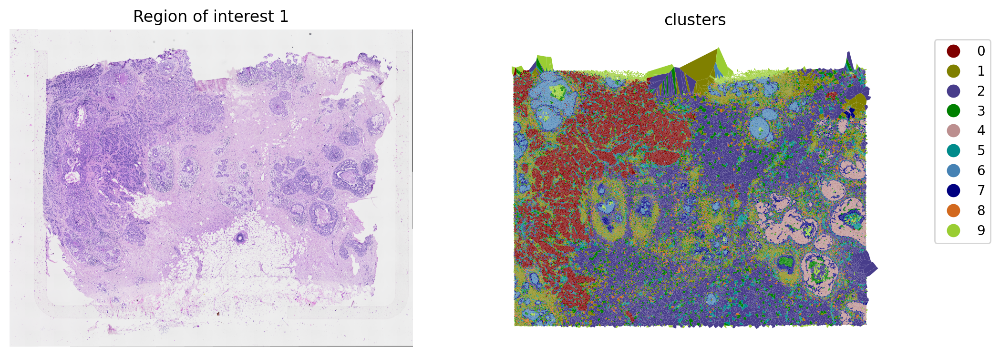

In [39]:
import sys
sys.path.append('../src/utils')
import os
import importlib
import image_plot_utils
importlib.reload(image_plot_utils)
from image_plot_utils import plot_clusters_and_save_image

# Plot and save the clustering results
plot_clusters_and_save_image(title="Region of interest 1", gdf=gdf, img=img, adata=count_area_filtered_adata, color_by_obs='clusters', output_name="image_clustering.ROI1.tiff")

In [28]:
merged_gdf = gdf.merge(count_area_filtered_adata.obs['clusters'].astype('category'), left_on='id', right_index=True)

<Axes: >

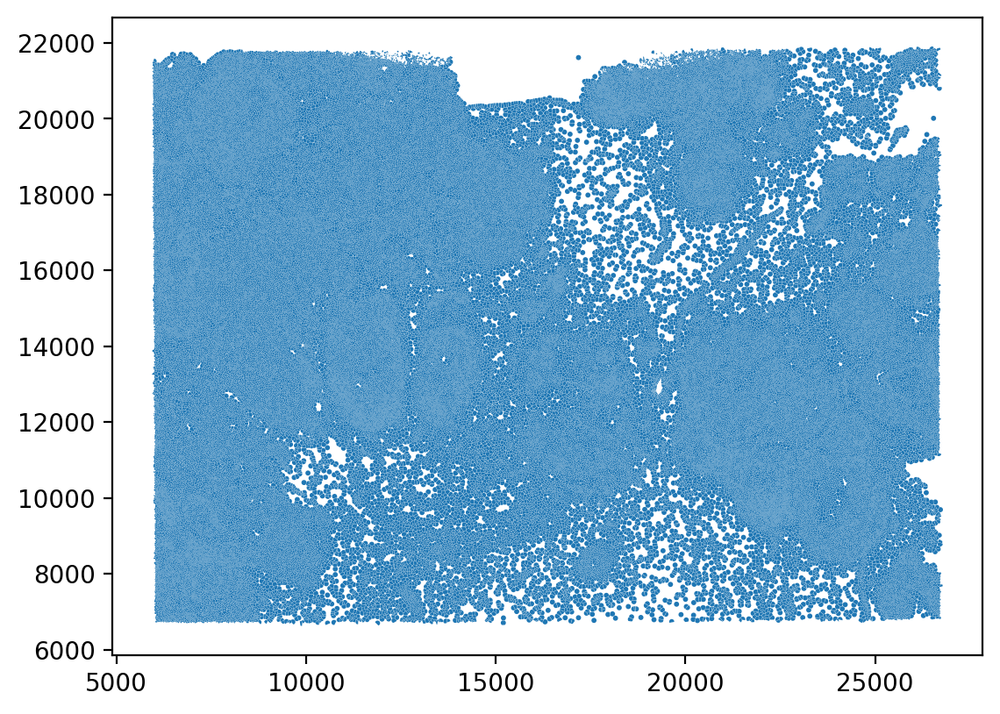

In [29]:
merged_gdf.plot()

In [30]:
merged_gdf_no_clusters = merged_gdf.drop(columns=['clusters'])

In [31]:
import sys
sys.path.append('../src/utils')
import os

# Importing importlib for module reloading
import importlib
import image_cropp_utils

# Reloading the module
importlib.reload(image_cropp_utils)

from image_cropp_utils import load_dataframe

In [32]:
cells_data = load_dataframe('../data/xenium/outs/cells.parquet')

In [33]:
cells_data

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area
0,1,847.259912,326.191365,28,1,0,29,58.387031,26.642188
1,2,826.341995,328.031830,94,0,0,94,197.016719,42.130781
2,3,848.766919,331.743187,9,0,0,9,16.256250,12.688906
3,4,824.228409,334.252643,11,0,0,11,42.311406,10.069844
4,5,841.357538,332.242505,48,0,0,48,107.652500,37.479688
...,...,...,...,...,...,...,...,...,...
167775,167776,7455.475342,5114.875415,229,1,0,230,220.452813,60.599688
167776,167777,7483.727051,5111.477490,79,0,0,79,37.389375,25.242344
167777,167778,7470.159424,5119.132056,397,0,0,397,287.058281,86.700000
167778,167779,7477.737207,5128.712817,117,0,0,117,235.354375,25.197188


In [34]:
import numpy as np
transform_matrix = np.array([
    [1.7125010585876286, 0.008345081015717404, -10397.19948741904],
    [0.008345081015717404, -1.7125010585876286, 37211.538978661185],
    [0, 0, 1]
])

# Get the inverse matrix
transform_matrix_inv = np.linalg.inv(transform_matrix)

# Extract coordinates and apply scaling
coords = cells_data[['x_centroid', 'y_centroid']].values
micron_to_pixel = 0.2125  # Microns per pixel
coords_scaled = coords / micron_to_pixel

# Function to transform coordinates
def transform_coordinates(coords, transform_matrix):
    coords = np.hstack((coords, np.ones((len(coords), 1))))
    transformed_coords = np.dot(transform_matrix, coords.T).T
    # Return only the x and y coordinates
    return transformed_coords[:, :2]

# Apply the transformation to the scaled coordinates
transformed_coords = transform_coordinates(coords_scaled, transform_matrix_inv)

# Update the DataFrame with the transformed coordinates
cells_data[['x_location_transformed', 'y_location_transformed']] = transformed_coords

In [35]:
from shapely.geometry import Polygon, Point
# Create a GeoDataFrame from cells_data
geometry = [Point(xy) for xy in zip(cells_data['x_location_transformed'], cells_data['y_location_transformed'])]
cells_gdf = gpd.GeoDataFrame(cells_data, geometry=geometry)
cells_gdf.crs = None

In [36]:
cells_gdf

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,x_location_transformed,y_location_transformed,geometry
0,1,847.259912,326.191365,28,1,0,29,58.387031,26.642188,8297.871957,20873.427800,POINT (8297.872 20873.428)
1,2,826.341995,328.031830,94,0,0,94,197.016719,42.130781,8240.416393,20868.090296,POINT (8240.416 20868.090)
2,3,848.766919,331.743187,9,0,0,9,16.256250,12.688906,8302.087393,20858.192164,POINT (8302.087 20858.192)
3,4,824.228409,334.252643,11,0,0,11,42.311406,10.069844,8234.691783,20850.967862,POINT (8234.692 20850.968)
4,5,841.357538,332.242505,48,0,0,48,107.652500,37.479688,8281.733889,20856.720876,POINT (8281.734 20856.721)
...,...,...,...,...,...,...,...,...,...,...,...,...
167775,167776,7455.475342,5114.875415,229,1,0,230,220.452813,60.599688,26520.667780,7803.121686,POINT (26520.668 7803.122)
167776,167777,7483.727051,5111.477490,79,0,0,79,37.389375,25.242344,26598.254969,7812.837128,POINT (26598.255 7812.837)
167777,167778,7470.159424,5119.132056,397,0,0,397,287.058281,86.700000,26561.075074,7791.621519,POINT (26561.075 7791.622)
167778,167779,7477.737207,5128.712817,117,0,0,117,235.354375,25.197188,26582.026307,7765.396076,POINT (26582.026 7765.396)


<Axes: >

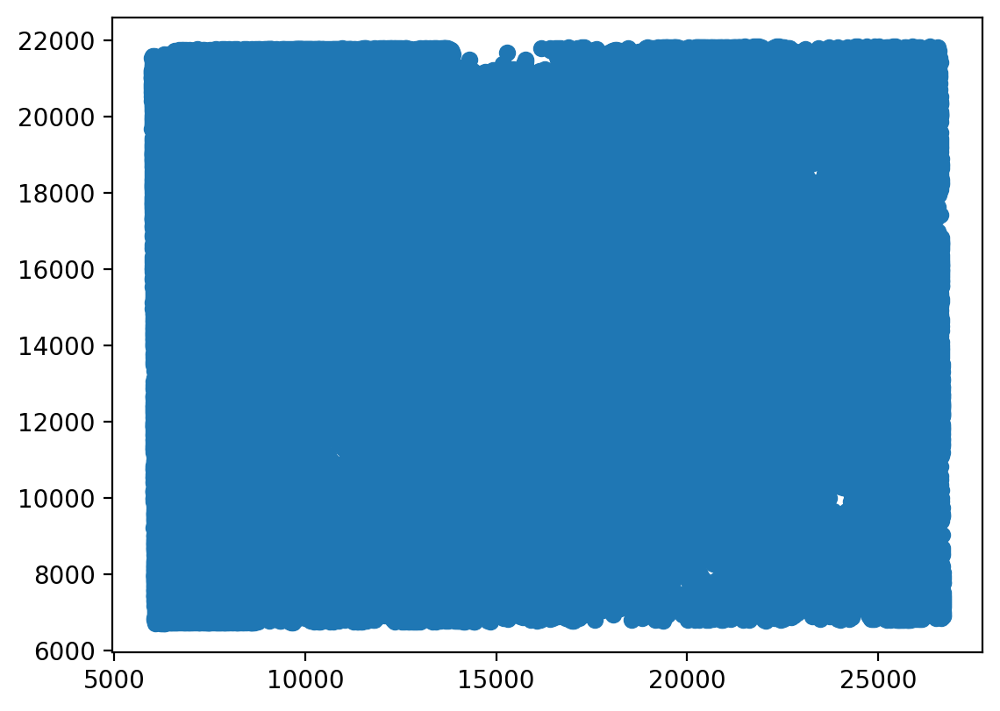

In [51]:
cells_gdf.plot()

In [37]:
# Perform spatial join
joined = gpd.sjoin(merged_gdf_no_clusters, cells_gdf, how='left', predicate='intersects')

<Axes: >

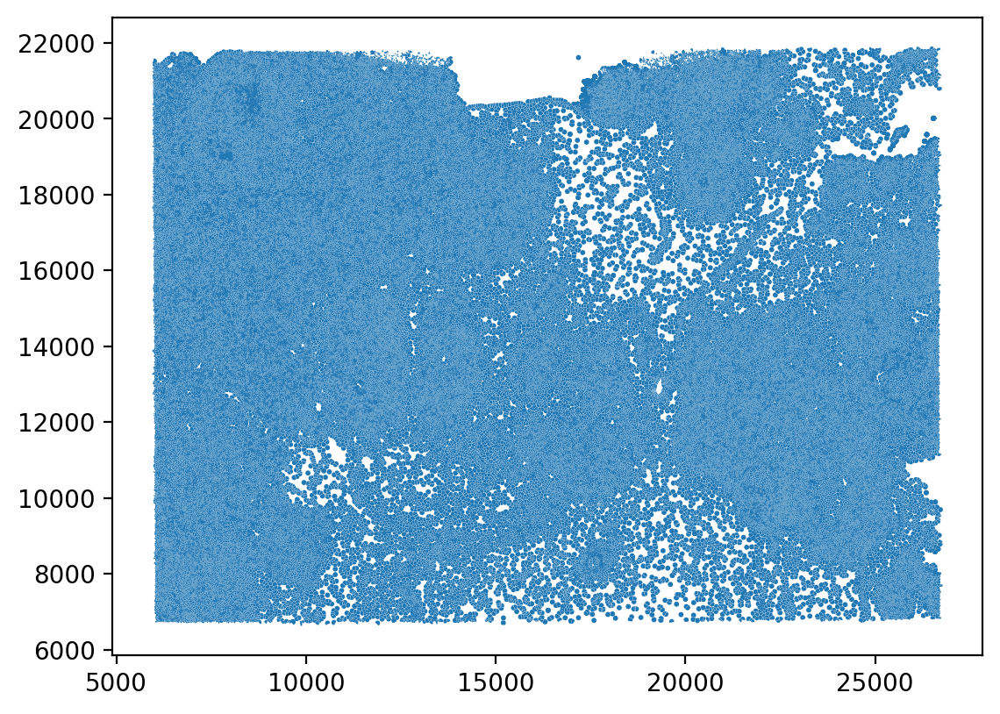

In [38]:
joined.plot()

In [50]:
joined

,geometry,id,index_right,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,x_location_transformed,y_location_transformed
6202,"POLYGON ((7110.770 6825.238, 7124.374 6854.249...",ID_6203,42284.0,42285.0,399.355255,5437.458716,592.0,0.0,0.0,592.0,398.142656,147.525469,7135.520510,6822.211526
6209,"POLYGON ((6279.099 6982.299, 6281.607 6953.524...",ID_6210,42966.0,42967.0,82.964026,5382.626245,173.0,0.0,0.0,173.0,179.405781,55.813125,6265.376854,6968.648654
6212,"POLYGON ((7193.251 6729.451, 7208.089 6732.524...",ID_6213,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6226,"POLYGON ((6454.599 7248.218, 6443.083 7263.338...",ID_6227,43061.0,43062.0,145.100730,5281.886304,108.0,0.0,0.0,108.0,110.632812,36.079844,6434.772936,7246.303336
6230,"POLYGON ((6907.168 7168.644, 6922.874 7168.744...",ID_6231,42582.0,42583.0,318.665202,5303.403174,252.0,1.0,0.0,253.0,150.280000,75.320625,6911.997752,7189.501397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215188,"POLYGON ((24366.226 21234.299, 24332.589 21219...",ID_215189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215189,"POLYGON ((25935.394 21766.393, 25909.894 21765...",ID_215190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215191,"POLYGON ((26626.521 21099.852, 26611.965 21188...",ID_215192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215192,"POLYGON ((25655.911 21595.849, 25644.229 21622...",ID_215193,151019.0,151020.0,7148.162988,85.906860,88.0,0.0,0.0,88.0,77.126875,17.881875,25608.865307,21618.076830


In [39]:
filtered_joined = joined[~joined['index_right'].isna()]

In [52]:
filtered_joined

,geometry,id,index_right,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,x_location_transformed,y_location_transformed
6202,"POLYGON ((7110.770 6825.238, 7124.374 6854.249...",ID_6203,42284.0,42285.0,399.355255,5437.458716,592.0,0.0,0.0,592.0,398.142656,147.525469,7135.520510,6822.211526
6209,"POLYGON ((6279.099 6982.299, 6281.607 6953.524...",ID_6210,42966.0,42967.0,82.964026,5382.626245,173.0,0.0,0.0,173.0,179.405781,55.813125,6265.376854,6968.648654
6226,"POLYGON ((6454.599 7248.218, 6443.083 7263.338...",ID_6227,43061.0,43062.0,145.100730,5281.886304,108.0,0.0,0.0,108.0,110.632812,36.079844,6434.772936,7246.303336
6230,"POLYGON ((6907.168 7168.644, 6922.874 7168.744...",ID_6231,42582.0,42583.0,318.665202,5303.403174,252.0,1.0,0.0,253.0,150.280000,75.320625,6911.997752,7189.501397
6242,"POLYGON ((6197.152 7191.234, 6198.145 7195.513...",ID_6243,43041.0,43042.0,64.706159,5305.564697,97.0,0.0,0.0,97.0,108.962031,28.854844,6214.174281,7180.161100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215150,"POLYGON ((24551.822 21053.233, 24552.658 21053...",ID_215151,150706.0,150707.0,6780.770825,316.917836,346.0,0.0,0.0,346.0,500.376406,28.674219,24602.404125,20978.363664
215161,"POLYGON ((24610.289 21843.078, 24611.536 21844...",ID_215162,12176.0,12177.0,6817.952515,8.849210,17.0,0.0,0.0,17.0,520.425781,13.953281,24700.450230,21825.401338
215170,"POLYGON ((26345.143 21835.015, 26350.693 21834...",ID_215171,12242.0,12243.0,7417.128223,26.647450,269.0,0.0,0.0,269.0,409.522031,8.037813,26347.159620,21784.516984
215170,"POLYGON ((26345.143 21835.015, 26350.693 21834...",ID_215171,12241.0,12242.0,7423.180322,9.744251,68.0,0.0,0.0,68.0,633.813125,9.844062,26363.563802,21831.046215


<Axes: >

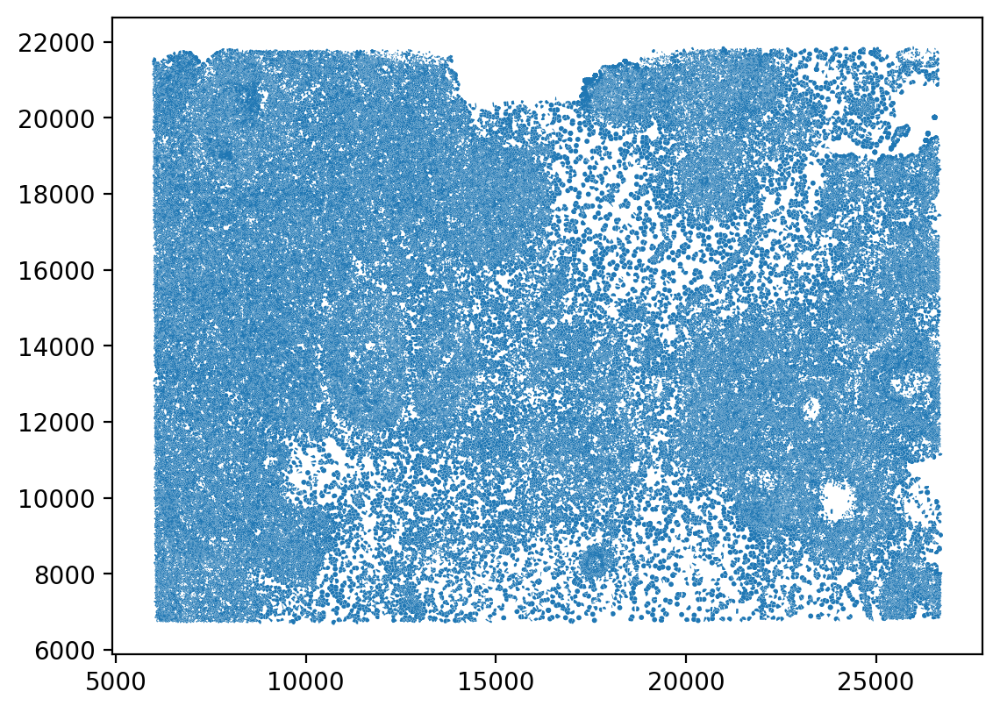

In [40]:
filtered_joined.plot()

In [41]:
import pandas as pd

# Group by 'id' and aggregate 'cell_id' by joining with a comma for duplicates
aggregated_df = filtered_joined.groupby('id').agg({
    'geometry': 'first',  # Keep the first geometry (assuming it's the same for duplicates)
    'cell_id': lambda x: ','.join(x.astype(str))  # Combine cell_id values with a comma
}).reset_index()

aggregated_df

,id,geometry,cell_id
0,ID_100000,"POLYGON ((23419.014 13083.284, 23419.567 13108...",142883.0
1,ID_100001,"POLYGON ((22648.130 12853.432, 22643.360 12832...",141638.0
2,ID_100002,"POLYGON ((20754.712 12329.975, 20735.874 12317...",133378.0
3,ID_100004,"POLYGON ((23154.718 12876.309, 23149.253 12842...",141054.0
4,ID_100006,"POLYGON ((22935.097 13177.512, 22933.994 13179...",141241.0
...,...,...,...
132156,ID_99993,"POLYGON ((22580.054 12805.815, 22574.912 12816...",141635.0
132157,ID_99996,"POLYGON ((23150.946 12914.551, 23161.630 12902...",141055.0
132158,ID_99997,"POLYGON ((20674.398 11046.569, 20693.384 11037...",134602.0
132159,ID_99998,"POLYGON ((22808.528 12188.345, 22798.453 12193...",145875.0


In [42]:
# Count the number of cell_ids by splitting on the comma and checking the length
aggregated_df['cell_id_count'] = aggregated_df['cell_id'].apply(lambda x: len(x.split(',')))

# Filter the rows where the count of cell_ids is greater than 1
rows_with_multiple_cell_ids = aggregated_df[aggregated_df['cell_id_count'] > 1]

# Count how many such rows exist
num_rows_with_multiple_cell_ids = rows_with_multiple_cell_ids.shape[0]

# Display the result
print(f"Number of rows with more than one cell_id: {num_rows_with_multiple_cell_ids}")


Number of rows with more than one cell_id: 21688


In [43]:
filtered_df = aggregated_df[aggregated_df['cell_id_count'] <= 1]

# Drop the 'cell_id_count' column if you no longer need it
filtered_df = filtered_df.drop(columns=['cell_id_count'])

# Display the resulting DataFrame
filtered_df

,id,geometry,cell_id
0,ID_100000,"POLYGON ((23419.014 13083.284, 23419.567 13108...",142883.0
1,ID_100001,"POLYGON ((22648.130 12853.432, 22643.360 12832...",141638.0
2,ID_100002,"POLYGON ((20754.712 12329.975, 20735.874 12317...",133378.0
3,ID_100004,"POLYGON ((23154.718 12876.309, 23149.253 12842...",141054.0
4,ID_100006,"POLYGON ((22935.097 13177.512, 22933.994 13179...",141241.0
...,...,...,...
132156,ID_99993,"POLYGON ((22580.054 12805.815, 22574.912 12816...",141635.0
132157,ID_99996,"POLYGON ((23150.946 12914.551, 23161.630 12902...",141055.0
132158,ID_99997,"POLYGON ((20674.398 11046.569, 20693.384 11037...",134602.0
132159,ID_99998,"POLYGON ((22808.528 12188.345, 22798.453 12193...",145875.0


In [44]:
filtered_gdf = gpd.GeoDataFrame(filtered_df, geometry='geometry')

<Axes: >

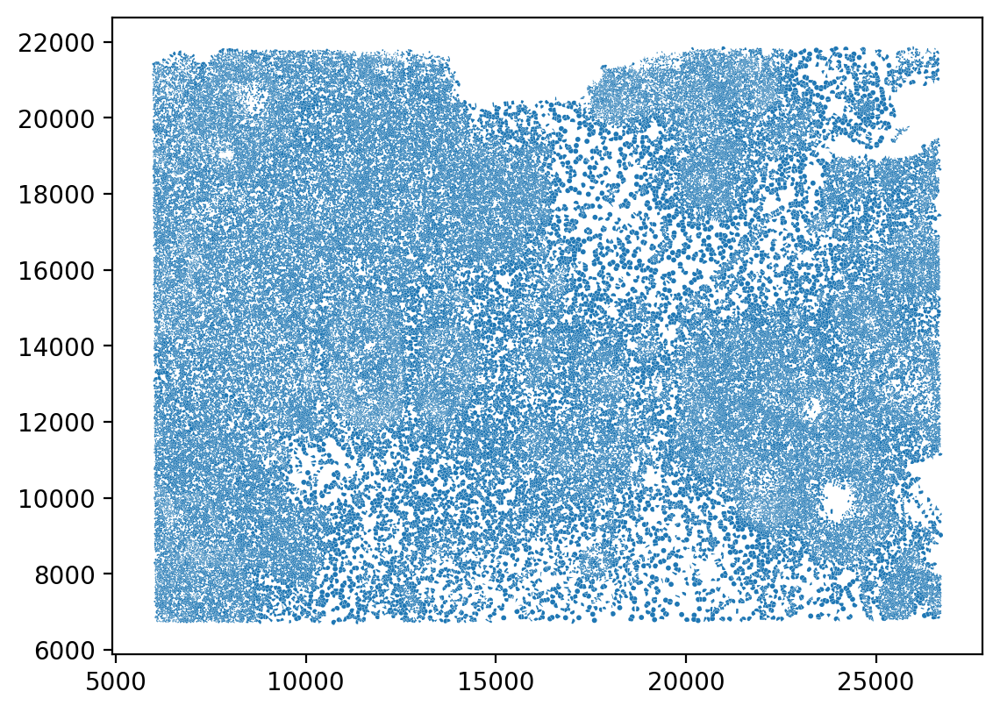

In [45]:
filtered_gdf.plot()

In [46]:
# important use as gdf for id mapping
filtered_gdf.to_file("../data/xenium/outs/final_adatas/filtered_gdf_voronoi_tresholded_buffered.geojson", driver='GeoJSON')

In [47]:
grouped_filtered_adata

AnnData object with n_obs × n_vars = 151974 × 541
    obs: 'id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'clusters'
    var: 'transcript_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'clusters'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [48]:
import anndata as ad

# Extract the ids from filtered_gdf
valid_ids = filtered_gdf['id'].tolist()

# Filter the rows in grouped_filtered_adata based on the valid ids
filtered_grouped_adata = grouped_filtered_adata[grouped_filtered_adata.obs['id'].isin(valid_ids)]


In [49]:
filtered_grouped_adata

View of AnnData object with n_obs × n_vars = 110473 × 541
    obs: 'id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'clusters'
    var: 'transcript_ids', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'clusters'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [50]:
filtered_grouped_adata.write("../data/xenium/improved_outs/grouped_filtered_voronoi_tresholded_bufered_adata.h5ad")
# IMPORTANT you will need this as ADATA